# 2.0 Mecanismos de autoatención por código

## 2.1 Atendiendo a diferentes partes del input con autoatención

### 2.1.1 Autoatención simplificada

Tomando como ejemplo un traductor por texto, cuando vas a traducir una oración a otro idioma este programa utiliza un mecanismo de recursión conforme se va escribiendo. Conforme se va desarrollando la escritura de la frase la traducción va mutando a la traducción final. Esto se debe a la escritura de palabra por palabra, cada vez que se añade a la frase cada una de ellas, este algoritmo vuelve hacia atrás a recordar la frase entera y finalmente traduce la palabra para integrarla adecuadamente en la sintaxis.

Cada token del output va a tener acceso a todos los tokens de de entrada, es decir, todos los tokens de entrada van a ser los causantes de cada uno de los tokens de salida.

Cada palabra de cada frase tendrá asignado un peso proporcional a su importancia dependiendo del contexto.

En la siguiente imagen se toma como referencia el token 2 y se evalúan los pesos de atención (importancia) de cada token del contexto con respecto al 2.

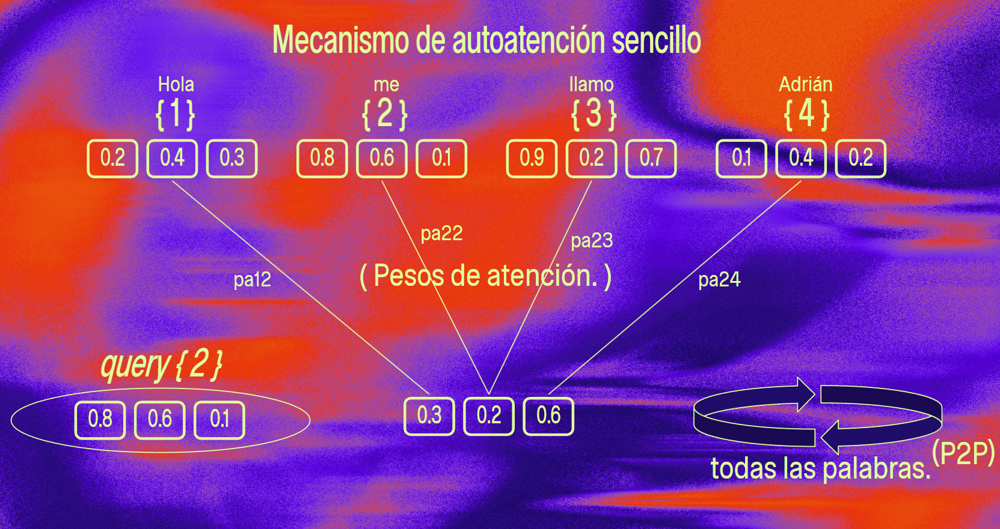

Como podenos observar, el resultado de la combinación entre los pesos de atención y los embed de los tokens de entrada es un vector de contexto.

In [49]:
import torch

inputs = torch.tensor(
    [[0.43, 0.15, 0.89], # Hola    (x^1)
     [0.55, 0.87, 0.66], # me      (x^2)
     [0.57, 0.85, 0.64], # llamo   (x^3)
     [0.22, 0.58, 0.33]] # Adrián  (x^4)
)

Para calcular los pesos de atención hay que realizar un paso previo, calcular los scores. Se haría mediante un procedimiento matemático que actúa como un método para medir la similitud entre 2 vectores.

In [50]:
input_query = inputs[1]
input_query

tensor([0.5500, 0.8700, 0.6600])

In [51]:
input_1 = inputs[0]
input_1

tensor([0.4300, 0.1500, 0.8900])

In [52]:
#Producto escalar de dos vectores
torch.dot(input_query,input_1)

tensor(0.9544)

In [53]:
#i será la posición del embed de un token la cuál comparará con input_query que cogimos al token x^2
#Hay que hacer que todos los vectores del contexto hagan el producto escalar entre sí.
i = 0

res = torch.dot(inputs[i],input_query)
res

tensor(0.9544)

In [54]:
inputs.shape[0]

4

In [55]:
query = inputs[1]

attn_scores_2 = torch.empty(inputs.shape[0])
for i, x_i in enumerate(inputs):
    attn_scores_2[i] = torch.dot(x_i,query)

print(attn_scores_2)

tensor([0.9544, 1.4950, 1.4754, 0.8434])


Ahora obtendremos los pesos de atención normalizando los scores obtenidos.

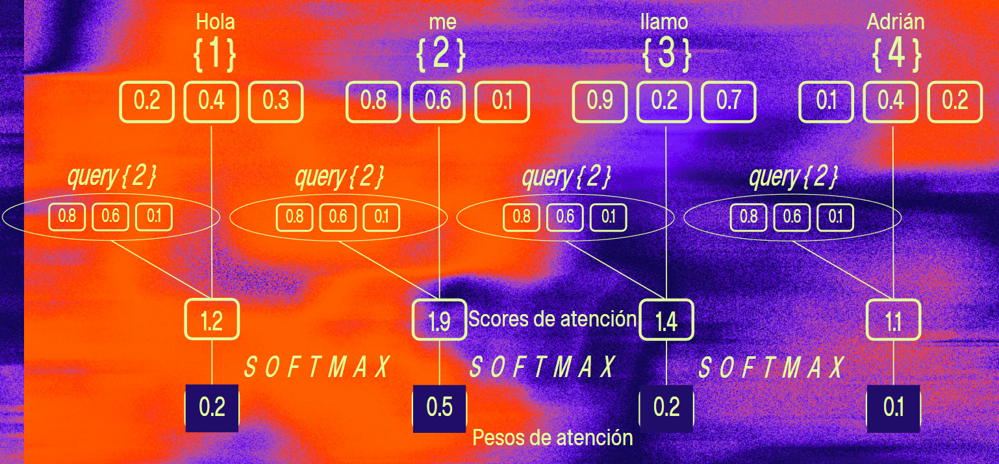

In [56]:
#Forma 1: la más simple
attn_weights_2_temp = attn_scores_2 / attn_scores_2.sum()
attn_weights_2_temp

tensor([0.2002, 0.3135, 0.3094, 0.1769])

In [57]:
#Forma 2: la más fiable a la realidad
def softmax_naive(x):
    return torch.exp(x) / torch.exp(x).sum(dim=0)
softmax_naive(attn_scores_2)

tensor([0.1888, 0.3242, 0.3179, 0.1690])

In [58]:
#Softmax también viene integrada en una función en pytorch
attn_weights_2=torch.softmax(attn_scores_2,dim=0)

Una vez tenemos los pesos de atención obtenidos por los scores normalizados con la función softmax, cada vector de entrada se multiplica por su peso de atención correspondiente. Si el peso es alto, la información de esa palabra pasará con más fuerza; si es bajo (como el 0.1), se ignora parcialmente. El vector de contexto será la suma de todos los vectores resultantes.

In [59]:
query = inputs[1]

context_vec_2 = torch.zeros(query.shape)
for i,x_i in enumerate(inputs):
    print(f"Multiplico este peso de atención (con respecto a x^2) {attn_weights_2[i]} por su vector de entrada x^{i+1} {x_i}")
    context_vec_2 += attn_weights_2[i]*x_i
    
print(context_vec_2)

Multiplico este peso de atención (con respecto a x^2) 0.18883292376995087 por su vector de entrada x^1 tensor([0.4300, 0.1500, 0.8900])
Multiplico este peso de atención (con respecto a x^2) 0.32423311471939087 por su vector de entrada x^2 tensor([0.5500, 0.8700, 0.6600])
Multiplico este peso de atención (con respecto a x^2) 0.31794002652168274 por su vector de entrada x^3 tensor([0.5700, 0.8500, 0.6400])
Multiplico este peso de atención (con respecto a x^2) 0.16899389028549194 por su vector de entrada x^4 tensor([0.2200, 0.5800, 0.3300])
tensor([0.4779, 0.6787, 0.6413])


### 2.1.2 Un mecanismo de atención propia simple sin pesos entrenables.

In [60]:
inputs

tensor([[0.4300, 0.1500, 0.8900],
        [0.5500, 0.8700, 0.6600],
        [0.5700, 0.8500, 0.6400],
        [0.2200, 0.5800, 0.3300]])

In [61]:
#Calculo los scores de atención mediante el producto escalar
attn_scores = torch.empty(4,4)

for i, x_i in enumerate(inputs):
    for j, x_j in enumerate(inputs):
        attn_scores[i, j] = torch.dot(x_i,x_j)

print(attn_scores)

tensor([[0.9995, 0.9544, 0.9422, 0.4753],
        [0.9544, 1.4950, 1.4754, 0.8434],
        [0.9422, 1.4754, 1.4570, 0.8296],
        [0.4753, 0.8434, 0.8296, 0.4937]])


In [62]:
#También se pueden calcular los scores de atención mediante la multiplicación de matrices pues está mejor optimizada en pytorch
#Para que nos salgan los valores en el orden correcto debemos trasponer uno de los productos y al final va a ser lo mismo que el producto escalar.
attn_scores = inputs @ inputs.T
attn_scores

tensor([[0.9995, 0.9544, 0.9422, 0.4753],
        [0.9544, 1.4950, 1.4754, 0.8434],
        [0.9422, 1.4754, 1.4570, 0.8296],
        [0.4753, 0.8434, 0.8296, 0.4937]])

In [63]:
#Finalmente calculamos los pesos de atención con la función softmax
#El dim=-1(columnas) indica que la suma de las probabilidades de la fila en softmax tiene que resultar en 1
attn_weights = torch.softmax(attn_scores, dim=-1)
attn_weights

tensor([[0.2863, 0.2737, 0.2704, 0.1695],
        [0.1888, 0.3242, 0.3179, 0.1690],
        [0.1897, 0.3233, 0.3174, 0.1695],
        [0.2046, 0.2956, 0.2915, 0.2084]])

In [64]:
#Calculamos los vectores de contexto, 1 por cada comparación
#Al multiplicar una matriz 4x4 y otra 4x3, la final me quedará 4x3, justo los vectores de contexto
all_context_vecs = attn_weights @ inputs
all_context_vecs

tensor([[0.4651, 0.6093, 0.6645],
        [0.4779, 0.6787, 0.6413],
        [0.4776, 0.6779, 0.6413],
        [0.4625, 0.6565, 0.6325]])

## 2.2 Implementando atención propia con pesos entrenables

### 2.2.1 Computando los pesos de atención paso por paso.

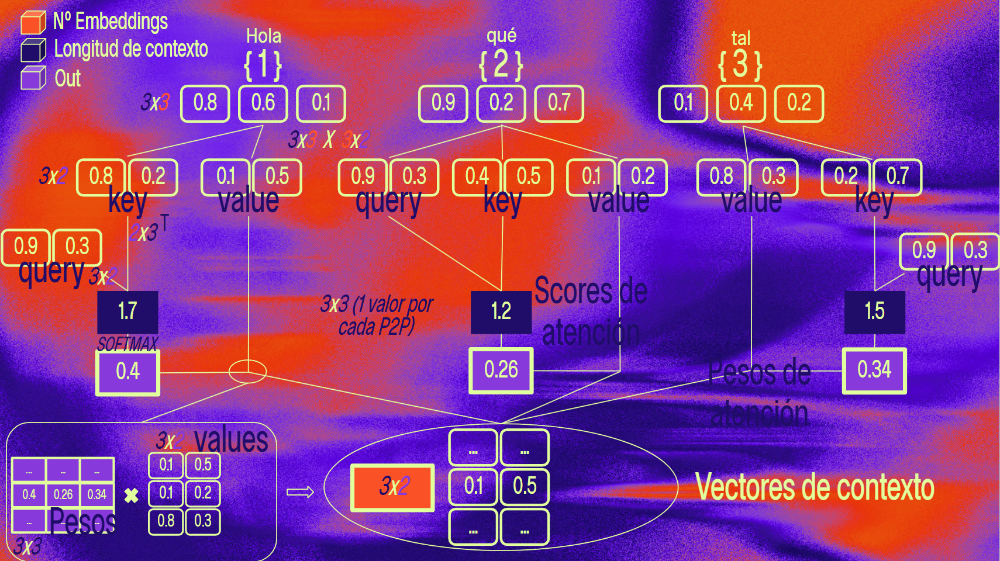

In [65]:
#Vectores de entrada (embeddings)
inputs = torch.tensor(
    [[0.43, 0.15, 0.89], # Hola    (x^1)
     [0.55, 0.87, 0.66], # qué     (x^2)
     [0.57, 0.85, 0.64]] # tal     (x^3)
)

In [66]:
#Cogemos el segundo embedding como el comparador como en el ejemplo anterior.
x_2 = inputs[1]

#El size del embedding
d_in = inputs.shape[1]

#Las columnas de query, clave y valor
d_out = 2

In [67]:
torch.manual_seed(123)

#Me creo los vectores query, clave y valor aleatorizados y de dimensiones 3x2
w_query = torch.nn.Parameter(torch.rand(d_in,d_out))
w_key = torch.nn.Parameter(torch.rand(d_in,d_out))
w_value = torch.nn.Parameter(torch.rand(d_in,d_out))

In [68]:
w_query

Parameter containing:
tensor([[0.2961, 0.5166],
        [0.2517, 0.6886],
        [0.0740, 0.8665]], requires_grad=True)

In [69]:
w_key

Parameter containing:
tensor([[0.1366, 0.1025],
        [0.1841, 0.7264],
        [0.3153, 0.6871]], requires_grad=True)

In [70]:
w_value

Parameter containing:
tensor([[0.0756, 0.1966],
        [0.3164, 0.4017],
        [0.1186, 0.8274]], requires_grad=True)

In [71]:
#Multiplico el segundo vector de entrada que será un tensor 1x3 por la matriz w_query 3x2 quedándome un resultado de 1x2
#Este resultado será la query del x^2 con la cuál calcularé los scores de atención para cuando x^2 sea el comparador multiplicándolo por las claves de cada uno.
query_2 = x_2 @ w_query
query_2

tensor([0.4306, 1.4551], grad_fn=<SqueezeBackward4>)

In [72]:
#Calculo las claves y los valores por cada x^n
keys = inputs @ w_key
values = inputs @ w_value

In [73]:
keys

tensor([[0.3669, 0.7646],
        [0.4433, 1.1419],
        [0.4361, 1.1156]], grad_fn=<MmBackward0>)

In [74]:
values

tensor([[0.1855, 0.8812],
        [0.3951, 1.0037],
        [0.3879, 0.9831]], grad_fn=<MmBackward0>)

In [75]:
#Ejemplo del cálculo del score de atención en el caso x^2 comparando con x^2, utilizando el producto escalar entre su vector clave y el query de la ronda
keys_2 = keys[1]
attn_score_22 = torch.dot(query_2,keys_2)

In [76]:
#Este es el valor de ese score de atención
attn_score_22

tensor(1.8524, grad_fn=<DotBackward0>)

In [77]:
#Ahora lo hacemos para todos multiplicando matrices, la matriz query de x^2 (1x2) y la matriz de las claves de x^n (3x2) TRASPUESTA, así se simula el producto escalar de forma eficiente.
#Aquí tendremos nuestros scores de atención para cuando sea el comparador x^2 respecto a todo el contexto.
attn_scores_2 = query_2 @ keys.T
attn_scores_2

tensor([1.2705, 1.8524, 1.8111], grad_fn=<SqueezeBackward4>)

In [78]:
#Ahora aplicamos la normalización en los scores de atención para obtener los pesos con softmax.
d_k = keys.shape[1]
#d_k**0.5 es el número de columnas de la matriz de claves elevado a 1/2, es decir, la raíz cuadrada del número de columnas
attn_weights_2 = torch.softmax(attn_scores_2 / d_k**0.5, dim=-1)
attn_weights_2

tensor([0.2516, 0.3797, 0.3687], grad_fn=<SoftmaxBackward0>)

En el paper Attention is All you Need de 2017, en la sección 3.2.1 "Scaled Dot-Product Attention". El texto indica que la entrada consiste en consultas (queries) y claves (keys) de dimensión $d_{k}$. Para obtener los pesos de atención, se calculan los productos de punto de la consulta con todas las claves y luego se divide cada uno por $\sqrt{d_{k}}$.

Los autores explican que para valores grandes de $d_{k}$, los productos de punto pueden crecer mucho en magnitud, lo que empuja la función softmax hacia regiones con gradientes extremadamente pequeños. Para contrarrestar este efecto, escalan los productos de punto por $\frac{1}{\sqrt{d_{k}}}$.

Por último una vez tenemos los pesos de atención ya podemos calcular el vector de contexto utilizando el vector valor de x^n multiplicado escalarmente por el vector que contiene los pesos de atención

In [79]:
context_vector_2 = attn_weights_2 @ values
context_vec_2

tensor([0.4779, 0.6787, 0.6413])

## 2.3 Implementando una clase de atención propia compacta

In [80]:
import torch.nn as nn
import torch

class SelfAttention_v1(nn.Module):
    def __init__(self,d_in,d_out):
        super().__init__()
        self.w_query = torch.nn.Parameter(torch.rand(d_in,d_out))
        self.w_key = torch.nn.Parameter(torch.rand(d_in,d_out))
        self.w_value = torch.nn.Parameter(torch.rand(d_in,d_out))
        
    def forward(self, x):
        queries = inputs @ w_query
        keys = inputs @ w_key
        values = inputs @ w_value

        attn_scores = queries @ keys.T
        attn_weights = torch.softmax(attn_scores / d_k**0.5, dim=-1)
        context_vec = attn_weights @ values
        
        return context_vec

torch.manual_seed(123)
sa_v1 = SelfAttention_v1(d_in,d_out)
sa_v1(inputs)

tensor([[0.3356, 0.9630],
        [0.3397, 0.9653],
        [0.3395, 0.9652]], grad_fn=<MmBackward0>)

In [81]:
import torch.nn as nn
class SelfAttention_v2(nn.Module):
    def __init__(self,d_in,d_out):
        super().__init__()
        self.w_query = torch.nn.Linear(d_in,d_out, bias=False)
        self.w_key = torch.nn.Linear(d_in,d_out, bias=False)
        self.w_value = torch.nn.Linear(d_in,d_out, bias=False)
        
    def forward(self, x):
        queries = self.w_query(x)
        keys = self.w_key(x)
        values = self.w_value(x)

        attn_scores = queries @ keys.T
        attn_weights = torch.softmax(attn_scores / d_k**0.5, dim=-1)
        context_vec = attn_weights @ values
        
        return context_vec

torch.manual_seed(789)
sa_v2 = SelfAttention_v2(d_in,d_out)
sa_v2(inputs)

tensor([[-0.1002,  0.0640],
        [-0.0999,  0.0633],
        [-0.0999,  0.0633]], grad_fn=<MmBackward0>)

## 2.4 Máscaras de atención

### 2.4.1 Aplicando una máscara de atención

El propósito de esta máscara es esconder los tokens futuros a la hora de calcular los pesos de atención. Esto se debe de hacer porque no debe de tener en cuenta palabras que el modelo aún no ha visto.

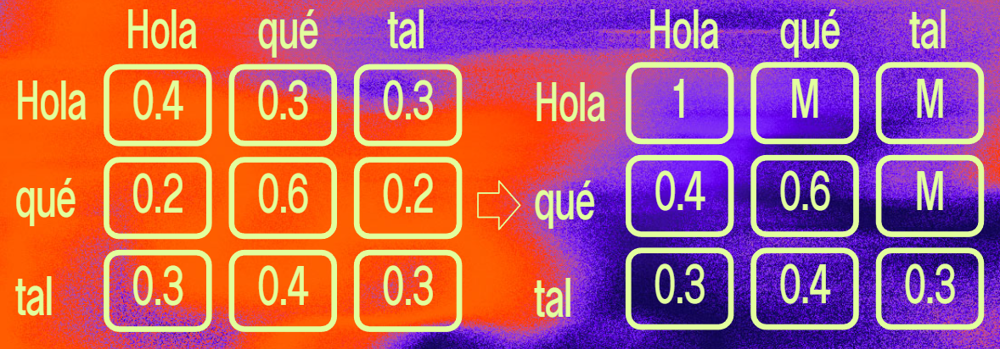

In [82]:
#Calculamos y guardamos los pesos de atención en su variable
queries = sa_v2.w_query(inputs)
keys = sa_v2.w_key(inputs)
values = sa_v2.w_value(inputs)

attn_scores = queries @ keys.T
attn_weights = torch.softmax(attn_scores / d_k**0.5, dim=-1)

In [83]:
attn_weights

tensor([[0.3681, 0.3155, 0.3164],
        [0.3807, 0.3094, 0.3100],
        [0.3800, 0.3097, 0.3103]], grad_fn=<SoftmaxBackward0>)

In [84]:
#Creo la máscara simple
#torch.tril para rellenar por debajo de la diagonal principal
context_length = attn_scores.shape[0]
mask_simple = torch.tril(torch.ones(context_length, context_length))
print(mask_simple)

tensor([[1., 0., 0.],
        [1., 1., 0.],
        [1., 1., 1.]])


In [85]:
masked_simple = attn_weights * mask_simple
masked_simple

tensor([[0.3681, 0.0000, 0.0000],
        [0.3807, 0.3094, 0.0000],
        [0.3800, 0.3097, 0.3103]], grad_fn=<MulBackward0>)

In [86]:
#Ahora tenemos que normalizar de nuevo para que cada fila sume 1
row_sums = masked_simple.sum(dim=-1, keepdim = True)
masked_simple_norm = masked_simple / row_sums
print(masked_simple_norm)

tensor([[1.0000, 0.0000, 0.0000],
        [0.5517, 0.4483, 0.0000],
        [0.3800, 0.3097, 0.3103]], grad_fn=<DivBackward0>)


La forma más eficiente de hacerlo sería directamente enmascarar sobre los scores de atención.

In [87]:
#torch.triu para rellenar por encima de la diagonal (tri de triangle y u de up)
mask = torch.triu(torch.ones(context_length,context_length), diagonal=1)
#Rellena donde sea True (-->1) en la máscara con menos infinitos ya que al aplicar softmax el resultado será 0.
masked = attn_scores.masked_fill(mask.bool(), -torch.inf)
print(masked)

tensor([[0.2899,   -inf,   -inf],
        [0.4656, 0.1723,   -inf],
        [0.4594, 0.1703, 0.1731]], grad_fn=<MaskedFillBackward0>)


In [88]:
print(mask)

tensor([[0., 1., 1.],
        [0., 0., 1.],
        [0., 0., 0.]])


In [89]:
attn_weights = torch.softmax(masked / d_k**0.5, dim=-1)
print(attn_weights)

tensor([[1.0000, 0.0000, 0.0000],
        [0.5517, 0.4483, 0.0000],
        [0.3800, 0.3097, 0.3103]], grad_fn=<SoftmaxBackward0>)


### 2.4.2 Aplicando máscaras a pesos de atención adicionales con dropout

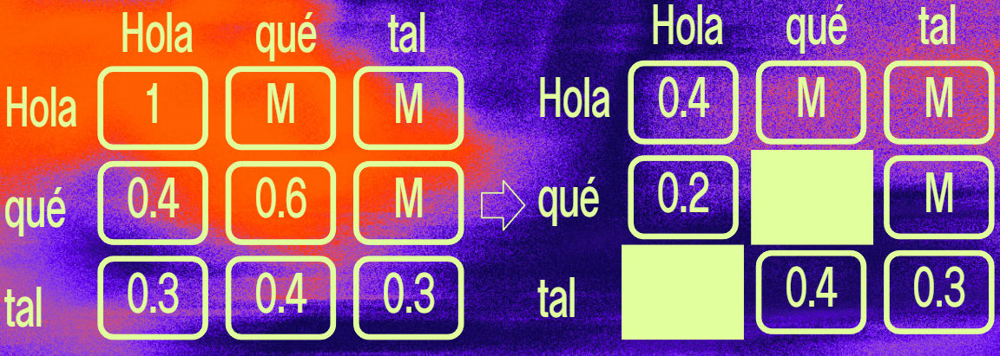

El dropout es una técnica de regularización utilizada en Deep Learning con el objetivo de evitar el sobreajuste a la hora del aprendizaje de patrones por el modelo. Sin el uso de esta técnica nos arriesgamos a que nuestro LLM aprenda patrones rígidos, lo cuál no nos interesa porque debe de ser flexible a la hora de entender un lenguaje. Al utilizar esta nueva máscara de dropout, forzamos a evitar el "enfoque de túnel", que impide que el modelo se obsesione con una sola palabra clave para entender el contexto. Si el modelo oculta la conexión más fuerte, se ve obligado a buscar otras relaciones semánticas útiles en las palabras restantes.

In [90]:
torch.manual_seed(123)
layer = torch.nn.Dropout(0.5)

In [91]:
ejemplo = torch.ones(3,3)
ejemplo

tensor([[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]])

In [92]:
layer(ejemplo)

tensor([[2., 2., 2.],
        [2., 2., 2.],
        [0., 2., 0.]])

Con la capa dropout se reescalan los valores que no se ocultan.

## 2.5 Implementando una clase de atención propia enmascarada compacta.

In [93]:
#Apila los dos tensores uno encima de otro (en 2 batches) si fuera uno al lado del otro seria dim=1
batch = torch.stack((inputs,inputs),dim=0)
batch.shape

torch.Size([2, 3, 3])

In [94]:
import torch.nn as nn
class MaskedAttention(nn.Module):
    def __init__(self,d_in,d_out,context_length,dropout):
        super().__init__()
        self.w_query = torch.nn.Linear(d_in,d_out, bias=False)
        self.w_key = torch.nn.Linear(d_in,d_out, bias=False)
        self.w_value = torch.nn.Linear(d_in,d_out, bias=False)
        self.dropout = torch.nn.Dropout(dropout)
        #Esto lo hacemos para que pytorch mueva los tensores arbitrarios como "torch.triu(torch.ones(context_length,context_length)" a la gráfica
        self.register_buffer("mask", torch.triu(torch.ones(context_length,context_length),diagonal=1))
        
    def forward(self, x):
        b, num_tokens, d_in = x.shape
        #x = batch 2 x 3 x 3
        queries = self.w_query(x)
        keys = self.w_key(x)
        values = self.w_value(x)

        #Como ahora al tener 2 batchs tengo los tensores query, clave y valor de 3 dimensiones (2,3,2), solo traspongo el 3 (shape[1]) y el 2 (shape[2])
        #(2,3,2) x (2,2,3) = attn_scores(2,3,3)
        attn_scores = queries @ keys.transpose(1,2)
        attn_scores.masked_fill_( #La _ al final del nombre en python indica que ocurren en la misma variable (in-place) lo mismo que si tuviera attn_scores = ... delante
            self.mask.bool()[:num_tokens, :num_tokens], -torch.inf)
        attn_weights = torch.softmax(
            attn_scores / keys.shape[-1]**0.5, dim=-1
        )
        attn_weights = self.dropout(attn_weights) # New
        
        context_vec = attn_weights @ values
        return context_vec

torch.manual_seed(789)

d_out = 2
d_in = 3
dropout = 0.0
context_length = batch.shape[1]
ma = MaskedAttention(d_in,d_out,context_length,dropout)
ma(batch)

tensor([[[-0.0872,  0.0286],
         [-0.0991,  0.0501],
         [-0.0999,  0.0633]],

        [[-0.0872,  0.0286],
         [-0.0991,  0.0501],
         [-0.0999,  0.0633]]], grad_fn=<UnsafeViewBackward0>)

## 2.6 Apilamiento de múltiples capas de atención de cabezal único

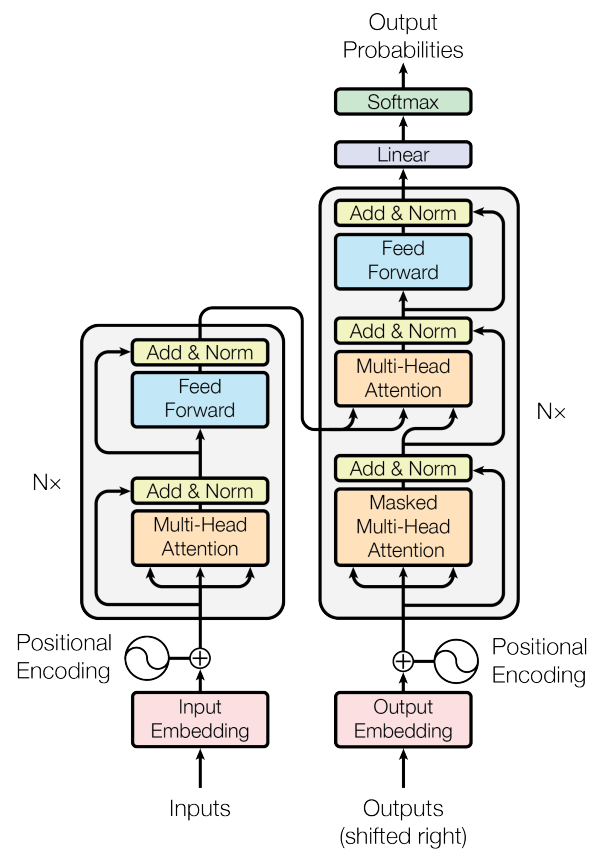

En el Paper de Google "Atention is All You Need", se nos presenta un diagrama en el que nos centraremos en la parte derecha (la parte izquierda ya está obsoleta), la cuál se lleva a cabo en todos los LLM que conocemos también llamado "Submódulo de Decodificación". Podemos apreciar que se menciona la sección "Masked Multi-Head Attention" que es donde nos centraremos en este apartado.

Hasta ahora, lo que hemos visto ha sido un proceso "Masked Single-Head Attention", por lo que nos centraremos en apilar varios de ellos simultáneamente con distintos pesos centrándonos en que cada uno de ellos extraiga diferentes características de la entrada.

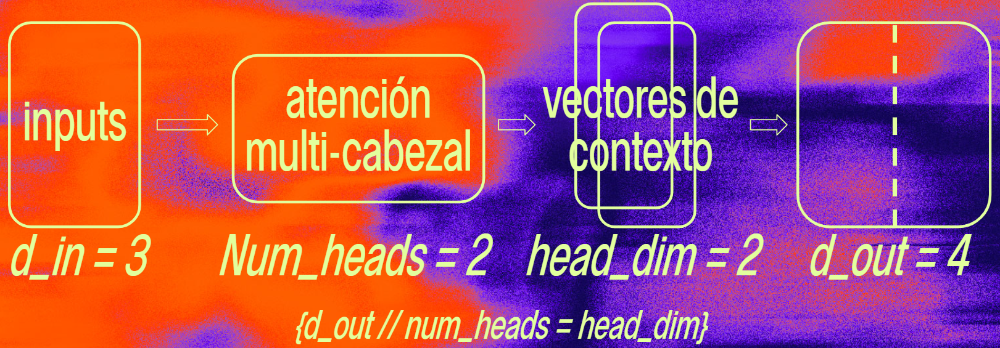

In [95]:
class MultiHeadAttentionWrapper(nn.Module):
    def __init__(self,d_in,d_out,context_length,dropout,num_heads=2):
        super().__init__()
        #ModuleList para propiedades que otorga pytorch (buffer y meterlo a gráfica)
        self.heads = nn.ModuleList([
            MaskedAttention(d_in,d_out,context_length,dropout) for _ in range(num_heads)
        ])

    def forward(self, x):
        #cat es el método que concatena tensores en pytorch
        #para cada cabeza en las cabezas definidas, le paso el tensor de entrada x (función forward de la clase MaskedAttention)
        return torch.cat([head(x) for head in self.heads],dim=-1)

torch.manual_seed(123)

context_length = batch.shape[1]
d_in, d_out = batch.shape[-1], 2

mha = MultiHeadAttentionWrapper(d_in, d_out, context_length, dropout=0.0, num_heads=2)
mha(batch)

tensor([[[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860]],

        [[-0.4519,  0.2216,  0.4772,  0.1063],
         [-0.5874,  0.0058,  0.5891,  0.3257],
         [-0.6300, -0.0632,  0.6202,  0.3860]]], grad_fn=<CatBackward0>)

### 2.6.1 Implementando atención multicabezal con splits de pesos

In [96]:
class MultiHeadAttention(nn.Module):
    def __init__(self, d_in, d_out, context_length, dropout, num_heads, qkv_bias=False):
        super().__init__()
        assert d_out % num_heads == 0, "d_out debe ser divisible por num_heads"

        #Aquí calculamos las dimensiones de query, key, y value
        #Calculamos las dimensiones para todas las cabezas juntas y luego hacemos que cada una tenga la misma salida
        self.d_out = d_out
        self.num_heads = num_heads
        self.head_dim = d_out // num_heads

        self.W_query = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_key = nn.Linear(d_in, d_out, bias=qkv_bias)
        self.W_value = nn.Linear(d_in, d_out, bias=qkv_bias)
        #Capa linear para combinar los outputs de cada cabeza
        self.out_proj = nn.Linear(d_out, d_out)
        self.dropout = nn.Dropout(dropout)
        self.register_buffer("mask", torch.triu(torch.ones(context_length, context_length), diagonal=1))

    def forward(self, x):
        b, num_tokens, d_in = x.shape

        keys = self.W_key(x)  #Shape: (b, num_tokens, d_out)
        queries = self.W_query(x)
        values = self.W_value(x)

        #Hacemos el split añadiendo las dimensiones de numero de cabezas y dimension de cabeza
        #Como d_out = num_heads * head_dim se splitea con view
        # (b, num_tokens, d_out) -> (b, num_tokens, num_heads, head_dim)
        # para cada batch hay tokens, para cada token hay cabezas, para cada cabeza hay x valores
        keys = keys.view(b, num_tokens, self.num_heads, self.head_dim)
        values = values.view(b, num_tokens, self.num_heads, self.head_dim)
        queries = queries.view(b, num_tokens, self.num_heads, self.head_dim)

        #Transpongo para posteriormente operar con (...,num_tokens,head_dim)
        #(b, num_tokens, num_heads, head_dim) -> (b, num_heads, num_tokens, head_dim)
        keys = keys.transpose(1, 2)
        queries = queries.transpose(1, 2)
        values = values.transpose(1, 2)

        #Calculo la atención propia enmascarada
        attn_scores = queries @ keys.transpose(2, 3)  

        #Extrae por filas y columnas hasta el número de tokens que tenemos de la máscara inicial y la pasa a bool siendo los 1s True
        mask_bool = self.mask.bool()[:num_tokens, :num_tokens]

        #Llena los valores True de la máscara con -infinito para aplicar softmax y que sea 0
        attn_scores.masked_fill_(mask_bool, -torch.inf)

        #Normaliza los scores de atención para calcular los pesos de atención
        attn_weights = torch.softmax(attn_scores / keys.shape[-1]**0.5, dim=-1)
        attn_weights = self.dropout(attn_weights)

        #Volvemos a (b, num_tokens, num_heads, head_dim)
        context_vec = (attn_weights @ values).transpose(1, 2)

        #Se combinan las cabezas, donde self.d_out = self.num_heads * self.head_dim
        context_vec = context_vec.reshape(b, num_tokens, self.d_out)
        #el modelo unifica y refina lo que cada cabezal ha aprendido
        context_vec = self.out_proj(context_vec)  

        return context_vec

batch_size, context_length, d_in = batch.shape
d_out = 4
mha = MultiHeadAttention(d_in,d_out,context_length,0.0,num_heads=2)

context_vecs = mha(batch)
print(context_vecs)

tensor([[[ 0.3685,  0.3820, -0.5535,  0.9064],
         [ 0.3387,  0.5292, -0.5076,  0.9170],
         [ 0.3284,  0.5820, -0.4901,  0.9177]],

        [[ 0.3685,  0.3820, -0.5535,  0.9064],
         [ 0.3387,  0.5292, -0.5076,  0.9170],
         [ 0.3284,  0.5820, -0.4901,  0.9177]]], grad_fn=<ViewBackward0>)
